In [1]:
import pandas as pd
import glob
import regex as re
import contextily as ctx
import geopandas as gpd
import matplotlib.pyplot as plt

/hpc/m3/python/3.11.11/data_science-2025.08.21/lib/python3.11/site-packages/requests/__init__.py:113: RequestsDependencyWarning: urllib3 (2.5.0) or chardet (7.4.3)/charset_normalizer (3.4.3) doesn't match a supported version!
  warnings.warn(


In [2]:
files = glob.glob("/projects/egodat/rts_fyre/images/nwhw/run_070926/*.json")

In [3]:
files

['/projects/egodat/rts_fyre/images/nwhw/run_070926/nwhy12_2025_32.85384300_-96.82792279_4873.rapidocr_v4.json',
 '/projects/egodat/rts_fyre/images/nwhw/run_070926/nwhy12_2020_32.87414394_-96.87710807_7432.easyocr.json',
 '/projects/egodat/rts_fyre/images/nwhw/run_070926/nwhy12_2022_32.85699490_-96.84118206_6642.easyocr.json',
 '/projects/egodat/rts_fyre/images/nwhw/run_070926/nwhy12_2022_32.84170580_-96.85866983_3625.rapidocr_v4.json',
 '/projects/egodat/rts_fyre/images/nwhw/run_070926/nwhy12_2025_32.86216889_-96.82165877_2283.rapidocr_v4.json',
 '/projects/egodat/rts_fyre/images/nwhw/run_070926/nwhy12_2022_32.87485708_-96.84917314_2482.rapidocr_v4.json',
 '/projects/egodat/rts_fyre/images/nwhw/run_070926/nwhy12_2026_32.87579394_-96.87143839_1753.rapidocr_v4.json',
 '/projects/egodat/rts_fyre/images/nwhw/run_070926/nwhy12_2023_32.85536462_-96.84539997_5155.rapidocr_v4.json',
 '/projects/egodat/rts_fyre/images/nwhw/run_070926/nwhy12_2026_32.85737388_-96.87312690_5725.easyocr.json',
 '/p

In [4]:
BigList = []

In [5]:
def dataload(file): #file function to add to BigData list
    #df = pd.read_json(file)
    try: 
        df = pd.read_json(file) 
    except ValueError as e: 
        print(f"Caught an empty or invalid JSON error: {e}") 
    # Fallback to an empty DataFrame 
        df = pd.DataFrame()
    df['source'] = file
    BigList.append(df)

In [7]:
for file in files:
    print(file)
    dataload(file)
BigData = pd.concat(BigList).reset_index()#concating files

/projects/egodat/rts_fyre/images/nwhw/run_070926/nwhy12_2025_32.85384300_-96.82792279_4873.rapidocr_v4.json
/projects/egodat/rts_fyre/images/nwhw/run_070926/nwhy12_2020_32.87414394_-96.87710807_7432.easyocr.json
/projects/egodat/rts_fyre/images/nwhw/run_070926/nwhy12_2022_32.85699490_-96.84118206_6642.easyocr.json
/projects/egodat/rts_fyre/images/nwhw/run_070926/nwhy12_2022_32.84170580_-96.85866983_3625.rapidocr_v4.json
/projects/egodat/rts_fyre/images/nwhw/run_070926/nwhy12_2025_32.86216889_-96.82165877_2283.rapidocr_v4.json
/projects/egodat/rts_fyre/images/nwhw/run_070926/nwhy12_2022_32.87485708_-96.84917314_2482.rapidocr_v4.json
/projects/egodat/rts_fyre/images/nwhw/run_070926/nwhy12_2026_32.87579394_-96.87143839_1753.rapidocr_v4.json
/projects/egodat/rts_fyre/images/nwhw/run_070926/nwhy12_2023_32.85536462_-96.84539997_5155.rapidocr_v4.json
/projects/egodat/rts_fyre/images/nwhw/run_070926/nwhy12_2026_32.85737388_-96.87312690_5725.easyocr.json
/projects/egodat/rts_fyre/images/nwhw/ru

In [8]:
BigData['run']=BigData['source'].apply(lambda x: x.split("/")[-1].split("_")[0])
BigData['year']=BigData['source'].apply(lambda x: x.split("/")[-1].split("_")[1])
BigData['latitude']=BigData['source'].apply(lambda x: x.split("/")[-1].split("_")[2])
BigData['longitude']=BigData['source'].apply(lambda x: x.split("/")[-1].split("_")[3])
#all splits in file name for classification

In [9]:
BigData

,index,image_path,perspective_preset,perspective_presets,results,source,run,year,latitude,longitude
0,0,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,"{'text': 'mm', 'confidence': 0.5987, 'yaw': -1...",/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2025,32.85384300,-96.82792279
1,1,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,"{'text': '→', 'confidence': 0.55428, 'yaw': 16...",/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2025,32.85384300,-96.82792279
2,2,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,"{'text': 'D', 'confidence': 0.7644200000000001...",/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2025,32.85384300,-96.82792279
3,0,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,"{'text': '# 4 `', 'confidence': 0.057859300260...",/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2020,32.87414394,-96.87710807
4,1,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,"{'text': '04', 'confidence': 0.131152640304186...",/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2020,32.87414394,-96.87710807
...,...,...,...,...,...,...,...,...,...,...
345750,1,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,"{'text': '72 2026 Google', 'confidence': 0.047...",/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2024,32.87601826,-96.85914509
345751,2,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,"{'text': '07026 Google', 'confidence': 0.45479...",/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2024,32.87601826,-96.85914509
345752,3,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,"{'text': '3', 'confidence': 0.0561112187464730...",/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2024,32.87601826,-96.85914509
345753,4,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,"{'text': 'e 1 .'', 'confidence': 0.04994852114...",/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2024,32.87601826,-96.85914509


In [10]:
image = glob.glob("/projects/egodat/rts_fyre/images//nwhw/*.jpg")

In [11]:
ImageList = []

In [12]:
ImageDF = pd.DataFrame(image, columns = ["filename"])

In [13]:
ImageDF['run']=ImageDF['filename'].apply(lambda x: x.split("/")[-1].split("_")[0])
ImageDF['year']=ImageDF['filename'].apply(lambda x: x.split("/")[-1].split("_")[1])
ImageDF['latitude']=ImageDF['filename'].apply(lambda x: x.split("/")[-1].split("_")[2])
ImageDF['longitude']=ImageDF['filename'].apply(lambda x: x.split("/")[-1].split("_")[3])

In [14]:
ImageDF

,filename,run,year,latitude,longitude
0,/projects/egodat/rts_fyre/images//nwhw/nwhy12_...,nwhy12,2024,32.84724800,-96.83715916
1,/projects/egodat/rts_fyre/images//nwhw/nwhy12_...,nwhy12,2024,32.87246932,-96.86079735
2,/projects/egodat/rts_fyre/images//nwhw/nwhy12_...,nwhy12,2022,32.86738847,-96.85783623
3,/projects/egodat/rts_fyre/images//nwhw/nwhy12_...,nwhy12,2023,32.85359827,-96.84762318
4,/projects/egodat/rts_fyre/images//nwhw/nwhy12_...,nwhy12,2024,32.84146943,-96.85931788
...,...,...,...,...,...
24167,/projects/egodat/rts_fyre/images//nwhw/nwhy12_...,nwhy12,2023,32.84750093,-96.83941881
24168,/projects/egodat/rts_fyre/images//nwhw/nwhy12_...,nwhy12,2024,32.86187336,-96.86543611
24169,/projects/egodat/rts_fyre/images//nwhw/nwhy12_...,nwhy12,2024,32.86329255,-96.82905441
24170,/projects/egodat/rts_fyre/images//nwhw/nwhy12_...,nwhy12,2023,32.86250446,-96.86021302


In [15]:
gdf_notext=gpd.GeoDataFrame(ImageDF, geometry=gpd.points_from_xy(ImageDF.longitude, ImageDF.latitude),crs="EPSG:4326")



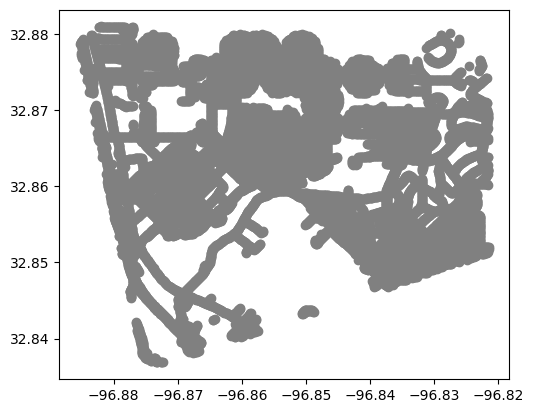

In [16]:
gdf_notext.plot(color = "grey")
gdf_notext = gdf_notext.to_crs(epsg=3857)

In [17]:
gdf_text=gpd.GeoDataFrame(BigData, geometry=gpd.points_from_xy(BigData.longitude, BigData.latitude),crs="EPSG:4326")

<Axes: >

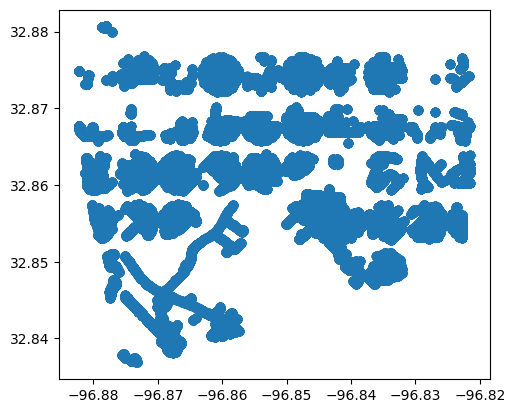

In [18]:
gdf_text.plot()

In [19]:
gdf_text = gdf_text.to_crs(epsg=3857)

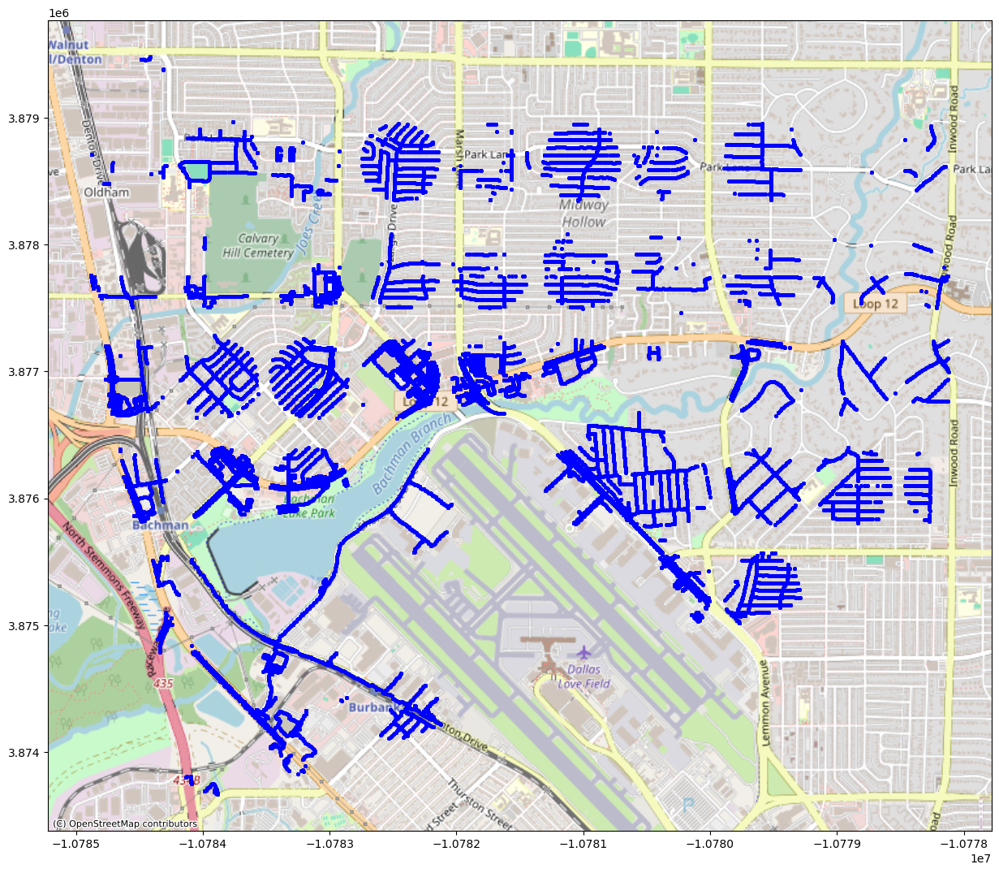

In [20]:
ax = gdf_text.plot(marker=".", color="blue", markersize=20, legend=True, figsize=(15,15))
ctx.add_basemap(ax,source=ctx.providers.OpenStreetMap.Mapnik, zoom=14)

In [21]:
BigData

,index,image_path,perspective_preset,perspective_presets,results,source,run,year,latitude,longitude
0,0,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,"{'text': 'mm', 'confidence': 0.5987, 'yaw': -1...",/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2025,32.85384300,-96.82792279
1,1,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,"{'text': '→', 'confidence': 0.55428, 'yaw': 16...",/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2025,32.85384300,-96.82792279
2,2,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,"{'text': 'D', 'confidence': 0.7644200000000001...",/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2025,32.85384300,-96.82792279
3,0,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,"{'text': '# 4 `', 'confidence': 0.057859300260...",/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2020,32.87414394,-96.87710807
4,1,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,"{'text': '04', 'confidence': 0.131152640304186...",/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2020,32.87414394,-96.87710807
...,...,...,...,...,...,...,...,...,...,...
345750,1,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,"{'text': '72 2026 Google', 'confidence': 0.047...",/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2024,32.87601826,-96.85914509
345751,2,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,"{'text': '07026 Google', 'confidence': 0.45479...",/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2024,32.87601826,-96.85914509
345752,3,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,"{'text': '3', 'confidence': 0.0561112187464730...",/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2024,32.87601826,-96.85914509
345753,4,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,"{'text': 'e 1 .'', 'confidence': 0.04994852114...",/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2024,32.87601826,-96.85914509


In [22]:
#BigData
# Separate the last column (which contains dictionaries) into its own dataframe
parsed_df = BigData.iloc[:, -6].apply(pd.Series)
#parsed_df = BigData
parsed_df
#parsed_df.sort_values(by='confidence', ascending=False)[:40]

parsed_df = pd.concat(
    [
        BigData["results"].apply(pd.Series),
        BigData.drop(columns=["results"])
    ],
    axis=1
)

In [23]:
parsed_df

,text,confidence,yaw,pitch,width,height,engine,index,image_path,perspective_preset,perspective_presets,source,run,year,latitude,longitude
0,mm,0.598700,-13.064450,2.252678,2.886297,2.397708,RAPID_OCR_V4,0,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2025,32.85384300,-96.82792279
1,→,0.554280,16.535147,-10.654770,0.659583,0.611481,RAPID_OCR_V4,1,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2025,32.85384300,-96.82792279
2,D,0.764420,16.552396,-10.654729,0.875670,0.797925,RAPID_OCR_V4,2,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2025,32.85384300,-96.82792279
3,# 4 `,0.057859,176.504698,-17.480639,2.216396,0.333370,EASYOCR,0,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2020,32.87414394,-96.87710807
4,04,0.131153,-139.515761,-1.344442,1.764348,1.286476,EASYOCR,1,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2020,32.87414394,-96.87710807
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
345750,72 2026 Google,0.047939,-136.620717,1.450544,2.184967,0.367287,EASYOCR,1,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2024,32.87601826,-96.85914509
345751,07026 Google,0.454791,-104.296859,-7.525002,2.306638,0.429394,EASYOCR,2,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2024,32.87601826,-96.85914509
345752,3,0.056111,129.100398,14.288515,1.574999,1.155030,EASYOCR,3,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2024,32.87601826,-96.85914509
345753,e 1 .',0.049949,116.364596,-9.260507,0.784408,0.188611,EASYOCR,4,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2024,32.87601826,-96.85914509


In [24]:
WordData = parsed_df[:] #isolating words from bigdata, keeping list separate

In [25]:
filtered_WordData = WordData[(WordData["text"].str.len().fillna(0) >= 3) & (WordData["confidence"] >= 0.75)]
filtered_WordData[:10] #post sorting function

,text,confidence,yaw,pitch,width,height,engine,index,image_path,perspective_preset,perspective_presets,source,run,year,latitude,longitude
23,6 #,0.943211,66.596193,12.805957,1.529175,1.062785,EASYOCR,4,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2022,32.85699490,-96.84118206
30,CCCCCC,0.808710,-122.066028,-11.646986,1.181690,0.344405,RAPID_OCR_V4,1,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2022,32.84170580,-96.85866983
33,RC AUTC REPA,0.871570,-89.342118,1.148127,2.702562,0.813421,RAPID_OCR_V4,4,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2022,32.84170580,-96.85866983
34,HAPI,0.982310,-52.582879,5.152895,1.429619,0.699016,RAPID_OCR_V4,5,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2022,32.84170580,-96.85866983
35,TIRES,0.969030,-49.741614,5.135417,2.082897,0.827783,RAPID_OCR_V4,6,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2022,32.84170580,-96.85866983
36,972730-6438,0.899550,-87.178828,1.261298,1.548354,0.552524,RAPID_OCR_V4,7,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2022,32.84170580,-96.85866983
39,LUREPAIR,0.868330,-50.260429,4.363126,3.059555,0.755332,RAPID_OCR_V4,10,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2022,32.84170580,-96.85866983
41,2700,0.998370,-29.414829,3.245790,1.154223,0.661336,RAPID_OCR_V4,12,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2022,32.84170580,-96.85866983
42,CRUISE AMERICA,0.963900,-43.959418,1.960686,4.422302,1.005441,RAPID_OCR_V4,13,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2022,32.84170580,-96.85866983
43,Brookfieltoo,0.896520,-32.539778,3.282708,4.961345,1.903245,RAPID_OCR_V4,14,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2022,32.84170580,-96.85866983


In [26]:
gdf_words=gpd.GeoDataFrame(filtered_WordData, geometry=gpd.points_from_xy(filtered_WordData.longitude, filtered_WordData.latitude),crs="EPSG:4326")


<Axes: >

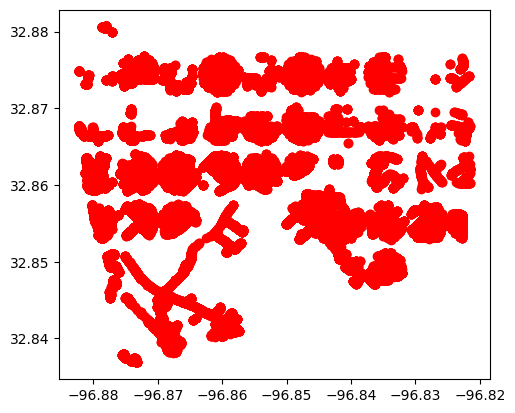

In [27]:
gdf_words.plot(color="red")

In [28]:
gdf_words = gdf_words.to_crs(epsg=3857)

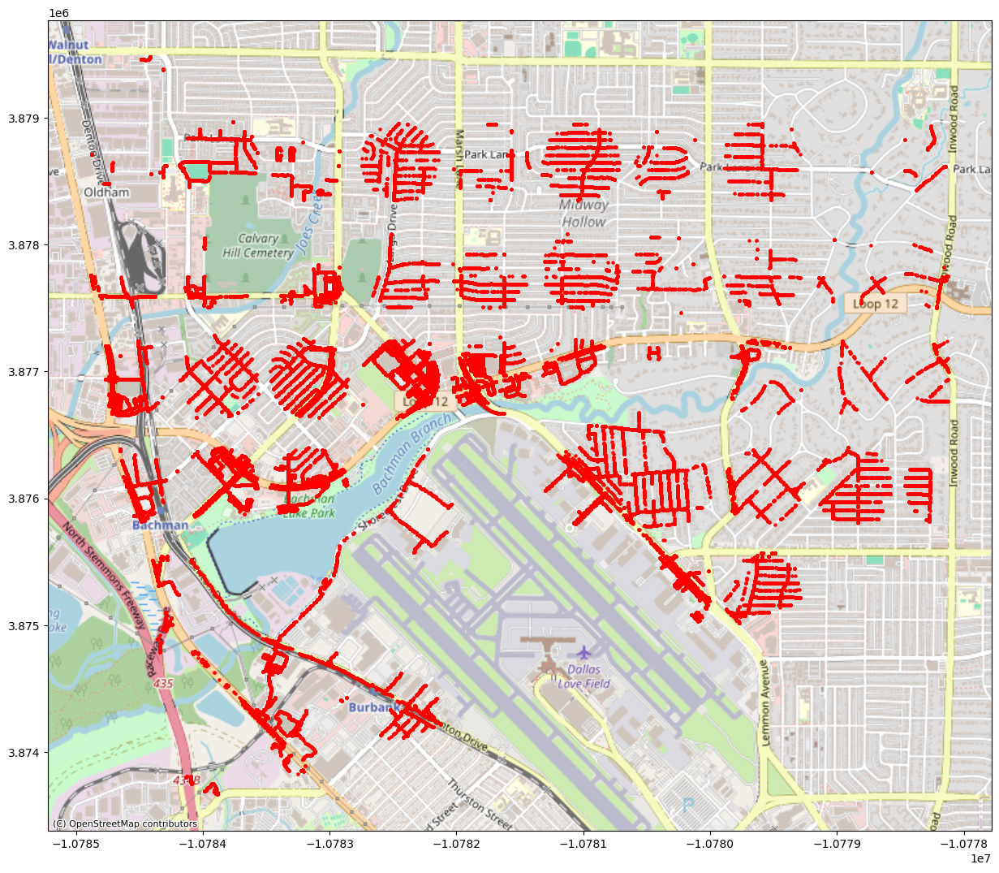

In [29]:
ax = gdf_words.plot(marker=".", color="red", markersize=20, legend=True, figsize=(15,15))
ctx.add_basemap(ax,source=ctx.providers.OpenStreetMap.Mapnik, zoom=14)

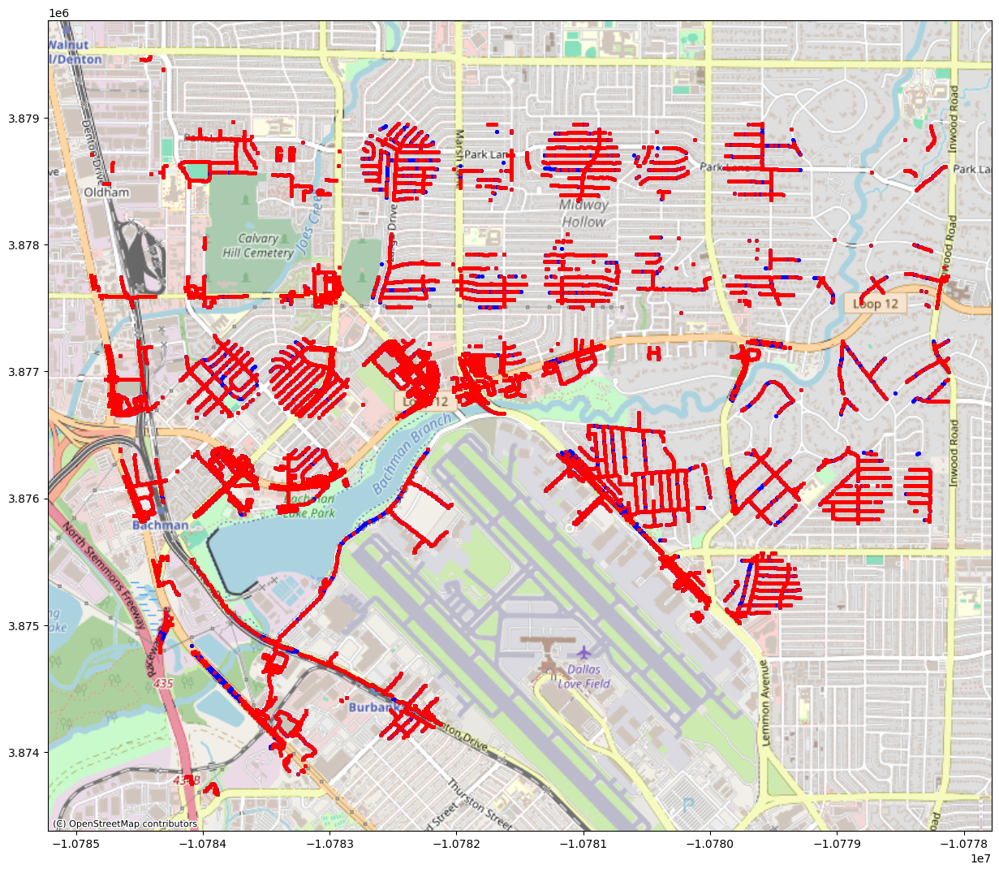

In [30]:
ax = gdf_text.plot(marker=".", color="blue", markersize=20, figsize=(15,15))

gdf_words.plot(ax=ax, marker=".", color="red", markersize=20, legend=True)

ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, zoom=14)

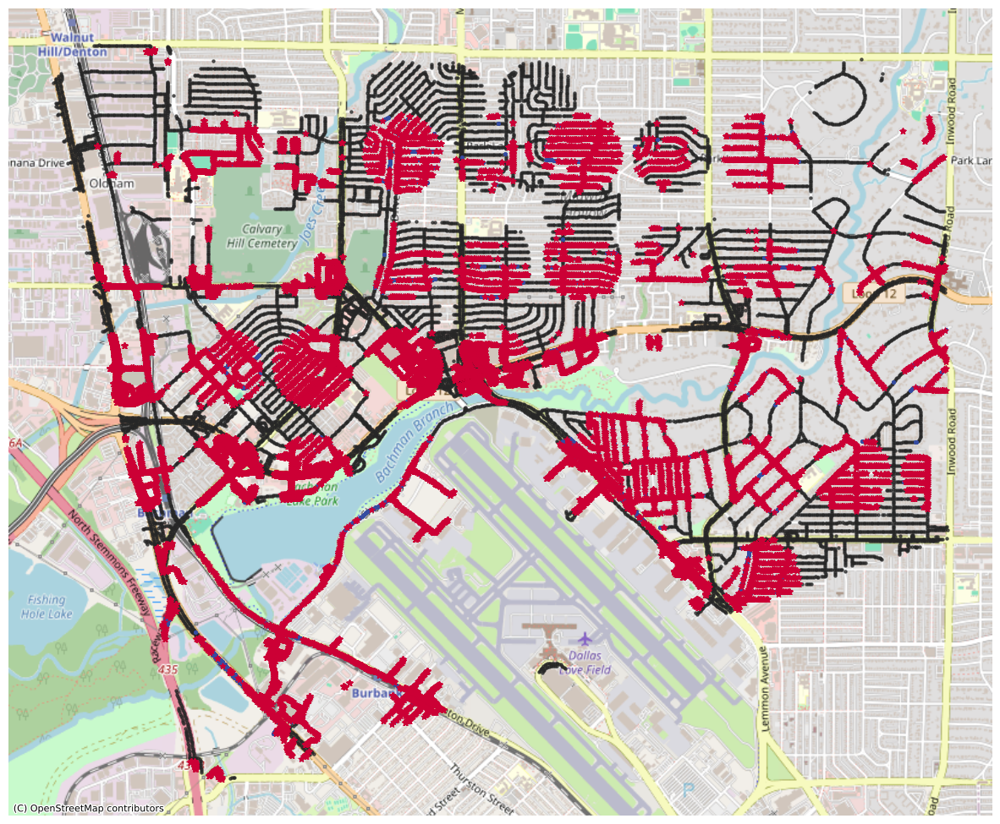

In [31]:
ax = gdf_notext.plot(marker=".", color="#262626", markersize=20, figsize=(15,15), alpha=0.7)

gdf_text.plot(ax=ax, marker=".", color="#354CA1", markersize=20, legend=True)

gdf_words.plot(ax=ax, marker="*", color="#CC0035", markersize=25, legend=True)

ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, zoom=14)

ax.set_axis_off()
ax.figure.savefig("SMU_OCR_map.jpg", dpi=200, bbox_inches="tight")
#final map

In [32]:
pip install wordfreq

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [33]:
from wordfreq import zipf_frequency

def is_word(word):
    word = word.lower()

    return (
        zipf_frequency(word, "en") > 2.5 or
        zipf_frequency(word, "es") > 2.5
    )

In [34]:
filtered_WordData.loc[:, "is_valid_word"] = filtered_WordData["text"].apply(is_word)

/tmp/ipykernel_1366990/2214647984.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_WordData.loc[:, "is_valid_word"] = filtered_WordData["text"].apply(is_word)


In [35]:
filtered_WordData

,text,confidence,yaw,pitch,width,height,engine,index,image_path,perspective_preset,perspective_presets,source,run,year,latitude,longitude,is_valid_word
23,6 #,0.943211,66.596193,12.805957,1.529175,1.062785,EASYOCR,4,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2022,32.85699490,-96.84118206,True
30,CCCCCC,0.808710,-122.066028,-11.646986,1.181690,0.344405,RAPID_OCR_V4,1,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2022,32.84170580,-96.85866983,False
33,RC AUTC REPA,0.871570,-89.342118,1.148127,2.702562,0.813421,RAPID_OCR_V4,4,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2022,32.84170580,-96.85866983,False
34,HAPI,0.982310,-52.582879,5.152895,1.429619,0.699016,RAPID_OCR_V4,5,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2022,32.84170580,-96.85866983,False
35,TIRES,0.969030,-49.741614,5.135417,2.082897,0.827783,RAPID_OCR_V4,6,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2022,32.84170580,-96.85866983,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
345674,02026 Google,0.816214,35.967238,5.590010,2.350634,0.398886,EASYOCR,7,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2020,32.87328914,-96.83574811,False
345697,RESTAURANT,0.764607,-7.595444,2.417408,4.024327,0.983537,EASYOCR,13,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2023,32.85699387,-96.87313254,True
345713,Shoes,0.991365,65.504051,-10.967770,1.605886,0.882599,EASYOCR,29,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2023,32.85699387,-96.87313254,True
345715,"Clothes,",0.932399,63.716160,-10.797345,1.868954,0.669767,EASYOCR,31,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2023,32.85699387,-96.87313254,True


In [36]:
filtered_WordData = filtered_WordData[
    filtered_WordData["text"].str.fullmatch(r"[A-Za-zÀ-ÖØ-öø-ÿ'-]+", na=False)
]

In [37]:
filtered_WordData

,text,confidence,yaw,pitch,width,height,engine,index,image_path,perspective_preset,perspective_presets,source,run,year,latitude,longitude,is_valid_word
30,CCCCCC,0.808710,-122.066028,-11.646986,1.181690,0.344405,RAPID_OCR_V4,1,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2022,32.84170580,-96.85866983,False
34,HAPI,0.982310,-52.582879,5.152895,1.429619,0.699016,RAPID_OCR_V4,5,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2022,32.84170580,-96.85866983,False
35,TIRES,0.969030,-49.741614,5.135417,2.082897,0.827783,RAPID_OCR_V4,6,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2022,32.84170580,-96.85866983,True
39,LUREPAIR,0.868330,-50.260429,4.363126,3.059555,0.755332,RAPID_OCR_V4,10,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2022,32.84170580,-96.85866983,False
43,Brookfieltoo,0.896520,-32.539778,3.282708,4.961345,1.903245,RAPID_OCR_V4,14,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2022,32.84170580,-96.85866983,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
345660,COLONYSQUARE,0.966440,-79.005792,-2.424934,4.339930,0.902540,RAPID_OCR_V4,4,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2024,32.87587418,-96.87517895,False
345661,ANY,0.996080,24.341519,1.314915,0.908155,0.526431,RAPID_OCR_V4,5,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2024,32.87587418,-96.87517895,True
345663,TIME,0.994670,24.351460,0.940180,0.942697,0.408677,RAPID_OCR_V4,7,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2024,32.87587418,-96.87517895,True
345697,RESTAURANT,0.764607,-7.595444,2.417408,4.024327,0.983537,EASYOCR,13,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2023,32.85699387,-96.87313254,True


In [38]:
traffic_stopwords = {
    # General
    "stop",
    "go",
    "slow",
    "yield",
    "wait",
    "merge",
    "detour",
    "exit",
    "entrance",

    # Direction
    "left",
    "right",
    "straight",
    "ahead",
    "north",
    "south",
    "east",
    "west",

    # Road
    "road",
    "street",
    "st",
    "ave",
    "avenue",
    "blvd",
    "boulevard",
    "lane",
    "ln",
    "drive",
    "dr",
    "parkway",
    "pkwy",
    "highway",
    "hwy",
    "route",

    # Traffic control
    "oneway",
    "one-way",
    "one",
    "way",
    "wrong",
    "turn",
    "uturn",
    "u-turn",
    "parking",
    "park",
    "crosswalk",
    "pedestrian",
    "school",
    "zone",

    # Restrictions
    "no",
    "only",
    "keep",
    "except",
    "closed",
    "open",
    "authorized",
    "permit",

    # Speed
    "speed",
    "mph",
    "limit",

    # Misc.
    "bus",
    "truck",
    "loading",
    "tow",
    "fire",
    "emergency",

    #Google
    "Google",
    "oogle",
    "gougle",
    "jougle",
    "goog"
}

In [39]:
no_traffic_data = filtered_WordData[
    ~filtered_WordData["text"].str.lower().isin(traffic_stopwords)
]

In [40]:
no_traffic_data

,text,confidence,yaw,pitch,width,height,engine,index,image_path,perspective_preset,perspective_presets,source,run,year,latitude,longitude,is_valid_word
30,CCCCCC,0.808710,-122.066028,-11.646986,1.181690,0.344405,RAPID_OCR_V4,1,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2022,32.84170580,-96.85866983,False
34,HAPI,0.982310,-52.582879,5.152895,1.429619,0.699016,RAPID_OCR_V4,5,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2022,32.84170580,-96.85866983,False
35,TIRES,0.969030,-49.741614,5.135417,2.082897,0.827783,RAPID_OCR_V4,6,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2022,32.84170580,-96.85866983,True
39,LUREPAIR,0.868330,-50.260429,4.363126,3.059555,0.755332,RAPID_OCR_V4,10,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2022,32.84170580,-96.85866983,False
43,Brookfieltoo,0.896520,-32.539778,3.282708,4.961345,1.903245,RAPID_OCR_V4,14,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2022,32.84170580,-96.85866983,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
345660,COLONYSQUARE,0.966440,-79.005792,-2.424934,4.339930,0.902540,RAPID_OCR_V4,4,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2024,32.87587418,-96.87517895,False
345661,ANY,0.996080,24.341519,1.314915,0.908155,0.526431,RAPID_OCR_V4,5,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2024,32.87587418,-96.87517895,True
345663,TIME,0.994670,24.351460,0.940180,0.942697,0.408677,RAPID_OCR_V4,7,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2024,32.87587418,-96.87517895,True
345697,RESTAURANT,0.764607,-7.595444,2.417408,4.024327,0.983537,EASYOCR,13,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2023,32.85699387,-96.87313254,True


In [41]:
no_traffic_data.sort_values(by='confidence', ascending=False)[:60]

,text,confidence,yaw,pitch,width,height,engine,index,image_path,perspective_preset,perspective_presets,source,run,year,latitude,longitude,is_valid_word
195657,elektra,1.000000,-85.489930,-7.148238,6.672203,2.289969,EASYOCR,56,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2022,32.86661626,-96.87435922,True
44506,elektra,0.999999,120.203714,-1.321833,2.339549,0.909903,EASYOCR,104,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2023,32.86361707,-96.86059371,True
193452,Market,0.999999,-146.623734,2.229367,2.949791,1.248771,EASYOCR,7,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2023,32.86225096,-96.85793948,True
28677,eck,0.999999,-66.814158,0.193651,1.378319,0.951221,EASYOCR,20,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2023,32.86735131,-96.87540547,True
124663,Lenel,0.999999,76.390742,14.250325,12.850456,5.442401,EASYOCR,5,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2024,32.86248720,-96.85292044,False
236664,tal,0.999999,-121.419700,-4.933345,1.221398,0.879977,EASYOCR,20,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2026,32.85499222,-96.86845461,True
93906,elektra,0.999999,67.685411,-1.552434,2.641620,0.926338,EASYOCR,78,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2023,32.86354584,-96.86051067,True
13963,catering,0.999999,-45.139058,-9.957088,4.539592,2.111558,EASYOCR,19,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2023,32.86099055,-96.85217412,True
333333,Research,0.999999,98.080924,17.764997,7.984390,2.819526,EASYOCR,38,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2024,32.83971008,-96.86862416,True
191761,elektra,0.999999,95.728595,0.553440,2.202509,0.739863,EASYOCR,44,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2024,32.86646050,-96.87440611,True


In [42]:
from wordfreq import zipf_frequency

def classify_language(word):
    word = word.lower()

    en_score = zipf_frequency(word, "en")
    es_score = zipf_frequency(word, "es")

    if en_score == 0 and es_score == 0:
        return "unknown"

    if en_score > es_score:
        return "english"

    elif es_score > en_score:
        return "spanish"

    else:
        return "ambiguous"

In [43]:
no_traffic_data.loc[:, "language"] = no_traffic_data["text"].apply(classify_language)

/tmp/ipykernel_1366990/127508498.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  no_traffic_data.loc[:, "language"] = no_traffic_data["text"].apply(classify_language)


In [44]:
no_traffic_data

,text,confidence,yaw,pitch,width,height,engine,index,image_path,perspective_preset,perspective_presets,source,run,year,latitude,longitude,is_valid_word,language
30,CCCCCC,0.808710,-122.066028,-11.646986,1.181690,0.344405,RAPID_OCR_V4,1,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2022,32.84170580,-96.85866983,False,unknown
34,HAPI,0.982310,-52.582879,5.152895,1.429619,0.699016,RAPID_OCR_V4,5,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2022,32.84170580,-96.85866983,False,english
35,TIRES,0.969030,-49.741614,5.135417,2.082897,0.827783,RAPID_OCR_V4,6,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2022,32.84170580,-96.85866983,True,english
39,LUREPAIR,0.868330,-50.260429,4.363126,3.059555,0.755332,RAPID_OCR_V4,10,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2022,32.84170580,-96.85866983,False,unknown
43,Brookfieltoo,0.896520,-32.539778,3.282708,4.961345,1.903245,RAPID_OCR_V4,14,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2022,32.84170580,-96.85866983,False,unknown
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
345660,COLONYSQUARE,0.966440,-79.005792,-2.424934,4.339930,0.902540,RAPID_OCR_V4,4,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2024,32.87587418,-96.87517895,False,unknown
345661,ANY,0.996080,24.341519,1.314915,0.908155,0.526431,RAPID_OCR_V4,5,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2024,32.87587418,-96.87517895,True,english
345663,TIME,0.994670,24.351460,0.940180,0.942697,0.408677,RAPID_OCR_V4,7,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2024,32.87587418,-96.87517895,True,english
345697,RESTAURANT,0.764607,-7.595444,2.417408,4.024327,0.983537,EASYOCR,13,/lustre/work/client/projects/egodat/rts_fyre/i...,default,NaN,/projects/egodat/rts_fyre/images/nwhw/run_0709...,nwhy12,2023,32.85699387,-96.87313254,True,english


In [45]:
no_traffic_data[["text", "language"]]

,text,language
30,CCCCCC,unknown
34,HAPI,english
35,TIRES,english
39,LUREPAIR,unknown
43,Brookfieltoo,unknown
...,...,...
345660,COLONYSQUARE,unknown
345661,ANY,english
345663,TIME,english
345697,RESTAURANT,english


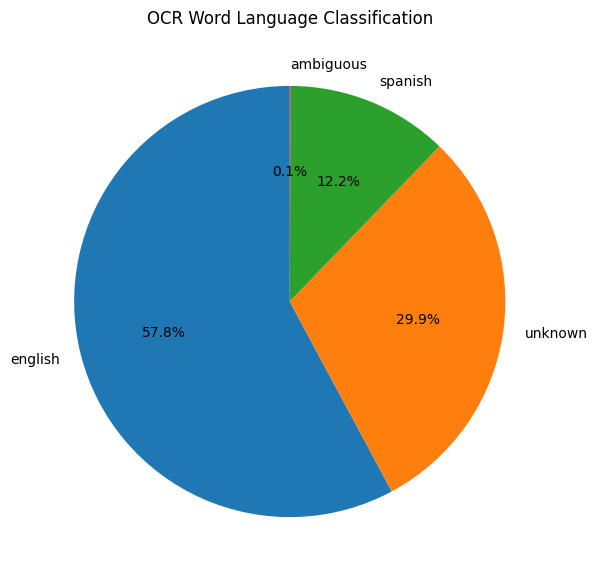

In [46]:
import matplotlib.pyplot as plt

# Count languages
language_counts = no_traffic_data["language"].value_counts()

# Pie chart
plt.figure(figsize=(7,7))
plt.pie(
    language_counts,
    labels=language_counts.index,
    autopct="%1.1f%%",
    startangle=90
)

plt.title("OCR Word Language Classification")
plt.show()

In [47]:
panorama_language = (
    no_traffic_data
    .groupby(["latitude", "longitude", "language"])
    .size()
    .reset_index(name="count")
)

dominant_language = (
    panorama_language
    .sort_values("count", ascending=False)
    .drop_duplicates(["latitude", "longitude"])
)

<Axes: >

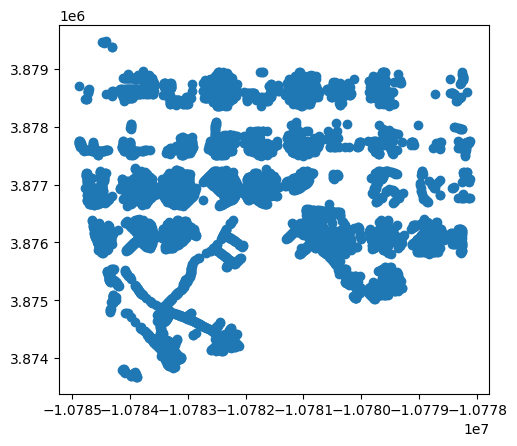

In [48]:
import geopandas as gpd
from shapely.geometry import Point

# Count languages by panorama location
panorama_language = (
    no_traffic_data
    .groupby(["latitude", "longitude", "language"])
    .size()
    .reset_index(name="count")
)

# Find dominant language at each panorama
dominant_language = (
    panorama_language
    .sort_values("count", ascending=False)
    .drop_duplicates(["latitude", "longitude"])
)
dominant_language = gpd.GeoDataFrame(
    dominant_language,
    geometry=gpd.points_from_xy(
        dominant_language["longitude"],
        dominant_language["latitude"]
    ),
    crs="EPSG:4326"   # latitude/longitude
)

dominant_language = dominant_language.to_crs(epsg=3857)

dominant_language.plot()


In [49]:
print(dominant_language.crs)
print(dominant_language.total_bounds)
dominant_language = dominant_language.to_crs(epsg=3857)

EPSG:3857
[-10784881.43558178   3873670.08685561 -10778124.17996417
   3879476.65508201]


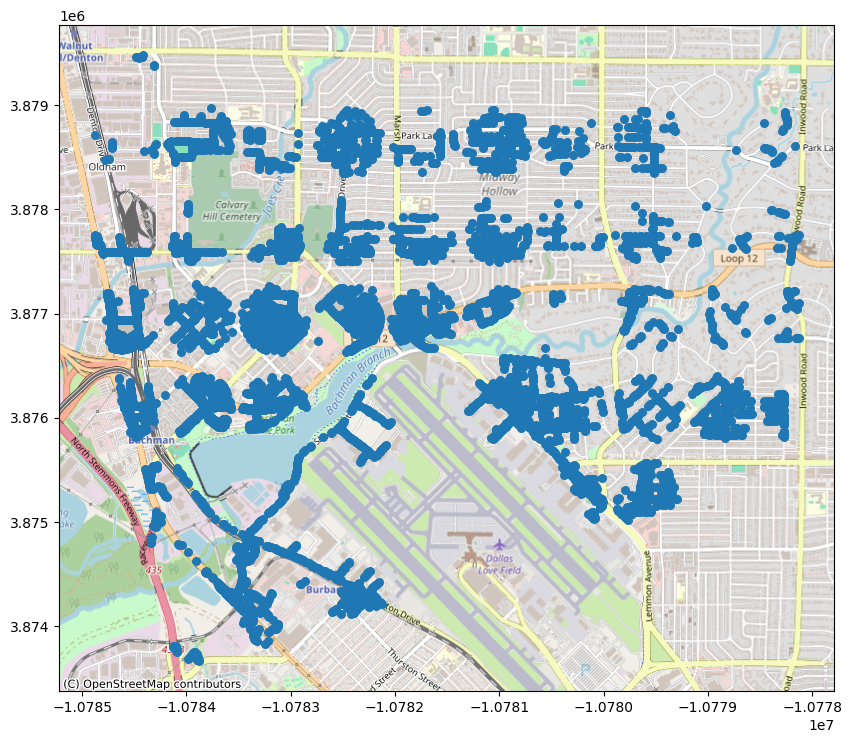

In [50]:
import matplotlib.pyplot as plt
import contextily as ctx

fig, ax = plt.subplots(figsize=(10,10))

dominant_language.plot(
    ax=ax,
    markersize=30
)

ctx.add_basemap(
    ax,
    source=ctx.providers.OpenStreetMap.Mapnik
)

plt.show()

In [51]:
dominant_language["language"].unique()

array(['english', 'unknown', 'spanish', 'ambiguous'], dtype=object)

In [52]:
dominant_language["language"].value_counts()

language
english      5079
unknown      1592
spanish       384
ambiguous       5
Name: count, dtype: int64

384


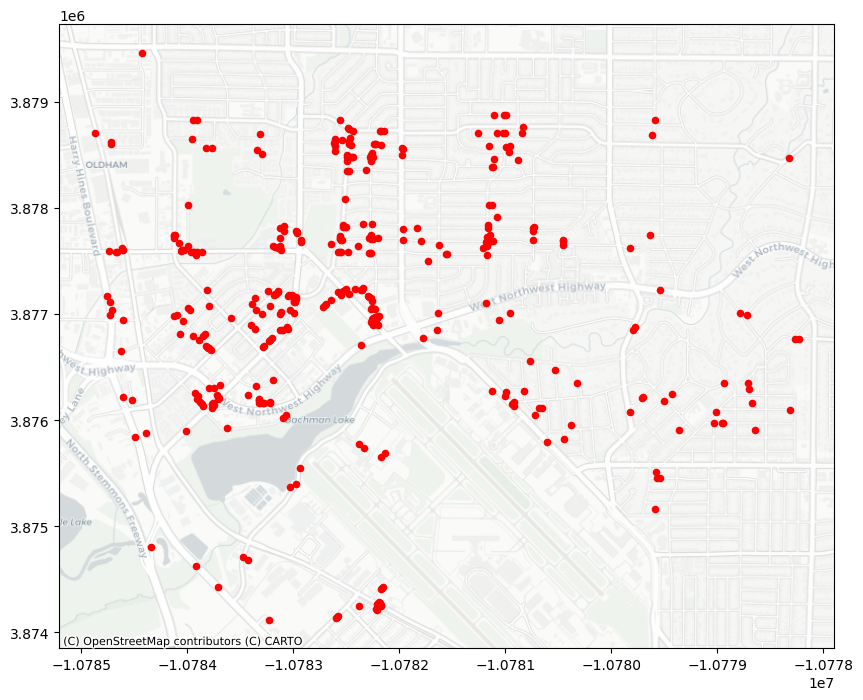

In [53]:
spanish_points = dominant_language[
    dominant_language["language"] == "spanish"
]

print(len(spanish_points))

fig, ax = plt.subplots(figsize=(10,10))

spanish_points.plot(
    ax=ax,
    color="red",
    markersize=20
)

ctx.add_basemap(
    ax,
    source=ctx.providers.CartoDB.Positron
)

plt.show()

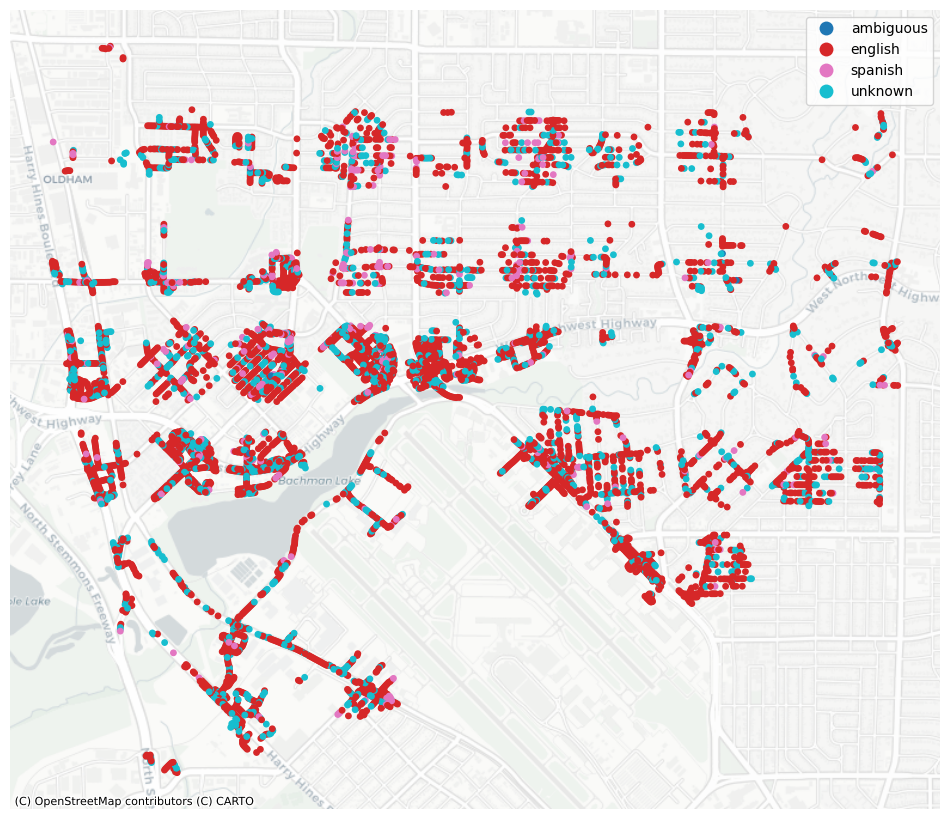

In [54]:
import matplotlib.pyplot as plt
import contextily as ctx

fig, ax = plt.subplots(figsize=(12, 12))

dominant_language.plot(
    ax=ax,
    column="language",
    categorical=True,
    legend=True,
    markersize=15
)

ctx.add_basemap(
    ax,
    source=ctx.providers.CartoDB.Positron
)

ax.set_axis_off()

plt.show()

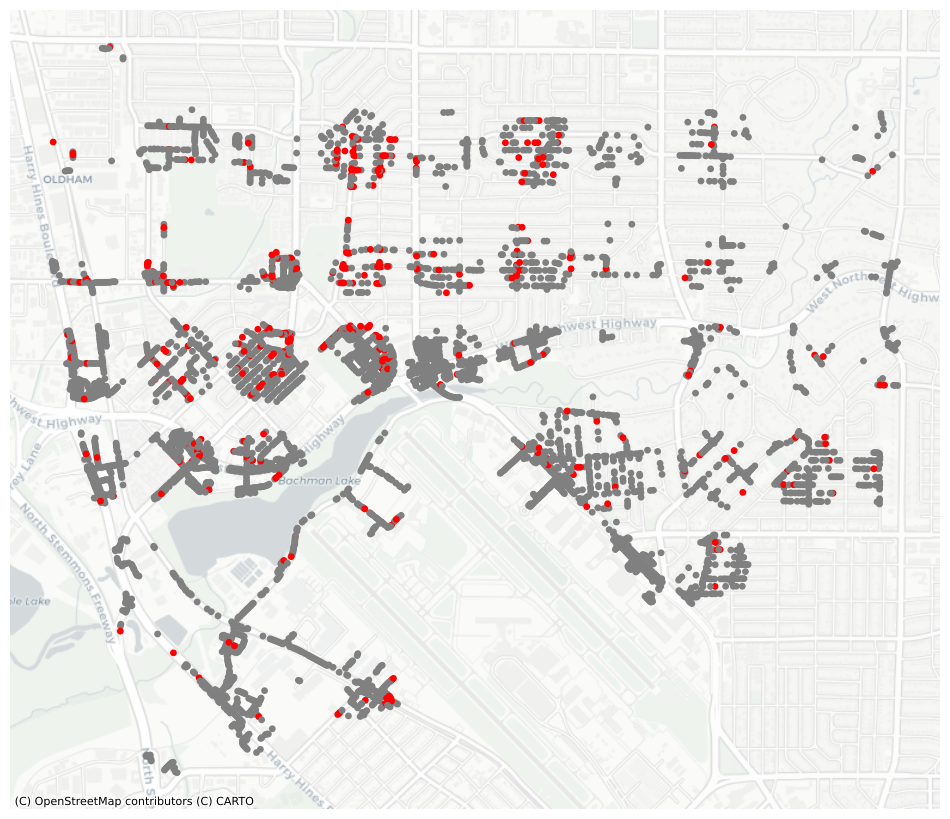

In [55]:
language_map = dominant_language[
    dominant_language["language"].isin(["english", "spanish"])
]

import matplotlib.pyplot as plt
import contextily as ctx

fig, ax = plt.subplots(figsize=(12, 12))

colors = {
    "english": "grey",
    "spanish": "red"
}

language_map.plot(
    ax=ax,
    color=language_map["language"].map(colors),
    markersize=15
)

ctx.add_basemap(
    ax,
    source=ctx.providers.CartoDB.Positron
)

ax.set_axis_off()
plt.savefig(
    "language_map.jpeg",
    dpi=300,
    bbox_inches="tight",
    format="jpeg"
)

plt.show()

In [56]:
import os
print(os.getcwd())

/users/dyankovsky/FYRE/Sample_images/panoocr_copy


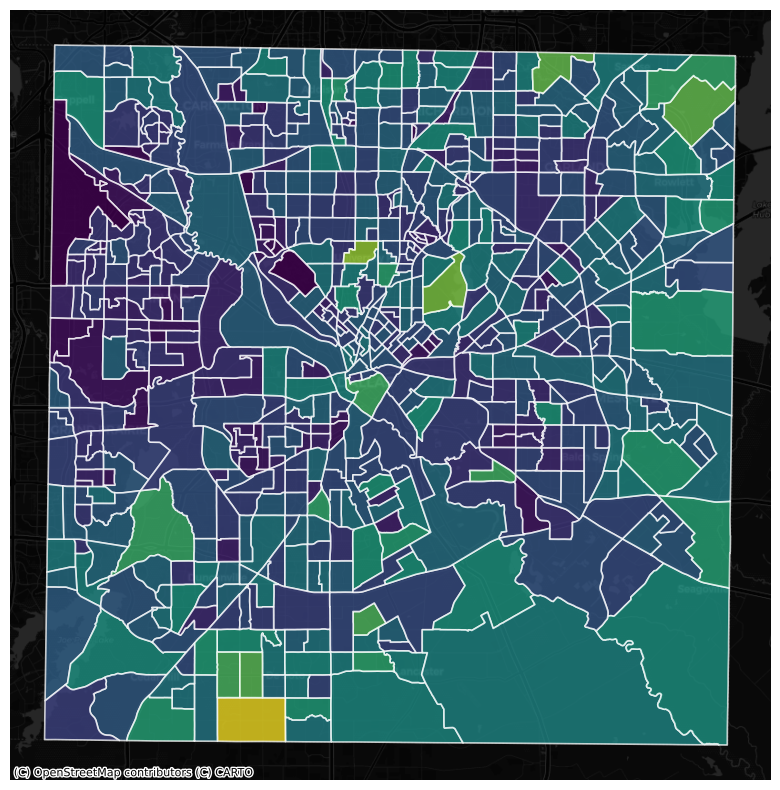

In [57]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx

gdf = gpd.read_file("Language_Data/acs2024_5yr_C16001_14000US48113018506.geojson")

gdf = gdf.to_crs(epsg=3857)

fig, ax = plt.subplots(figsize=(10, 10))

gdf[1:].plot(
    ax=ax,
    column="C16001002",
    #color="#7fd6d1",       # teal fill
    edgecolor="white",    # white borders
    linewidth=1.2,
    alpha=0.75
)

ctx.add_basemap(
    ax,
    source=ctx.providers.CartoDB.DarkMatter
)
ax.set_axis_off()

plt.show()

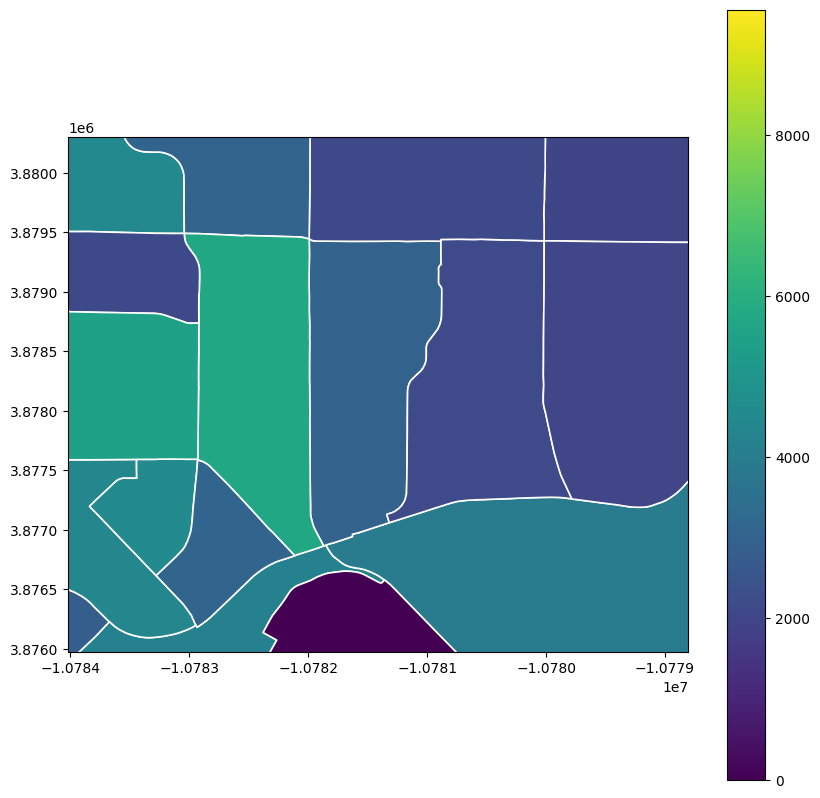

In [58]:
import matplotlib.pyplot as plt

# Plot everything first
fig, ax = plt.subplots(figsize=(10,10))

gdf[1:].plot(
    column="C16001001",
    legend=True,
    edgecolor="white",
    linewidth=1.2,
    ax=ax
)

# --- Find the tracts you care about ---
focus = gdf[
    gdf["name"].isin(["Census Tract 98.02, Dallas, TX", "Census Tract 94.01, Dallas, TX", "Census Tract 94.02, Dallas, TX"])
]

# Get bounding box
xmin, ymin, xmax, ymax = focus.total_bounds

# Add some padding so surrounding area is visible
xpad = (xmax - xmin) * 0.3
ypad = (ymax - ymin) * 0.3

# Zoom to area
ax.set_xlim(xmin - xpad, xmax + xpad)
ax.set_ylim(ymin - ypad, ymax + ypad)

plt.show()

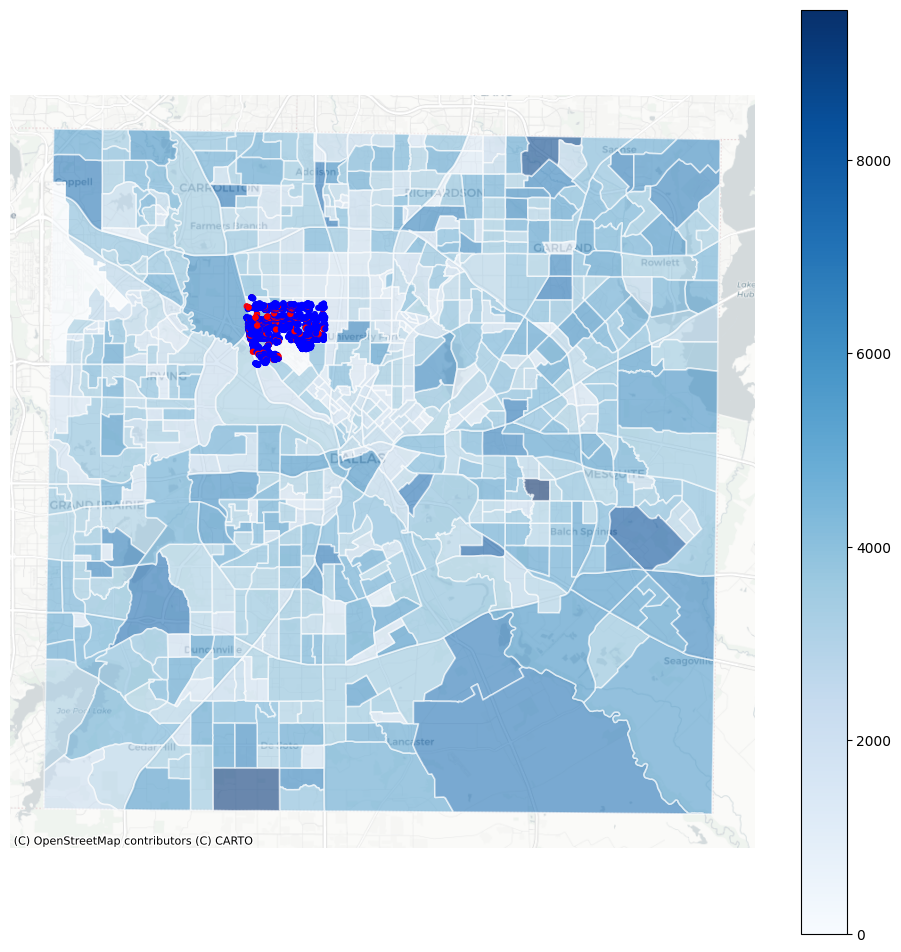

In [59]:
import matplotlib.pyplot as plt
import contextily as ctx

# Ensure both layers are in Web Mercator
tracts = gdf[1:].to_crs(epsg=3857)
points = language_map.to_crs(epsg=3857)

fig, ax = plt.subplots(figsize=(12, 12))

# 1. Census tract choropleth
tracts.plot(
    ax=ax,
    column="C16001001",      # <-- replace with your actual column
    cmap="Blues",
    alpha=0.6,
    edgecolor="white",
    linewidth=1.2,
    legend=True
)

# 2. English/Spanish panorama points
colors = {
    "english": "blue",
    "spanish": "red"
}

points.plot(
    ax=ax,
    color=points["language"].map(colors),
    markersize=12,
    zorder=3
)

# 3. Optional basemap underneath everything
ctx.add_basemap(
    ax,
    source=ctx.providers.CartoDB.Positron,
    zorder=0
)

ax.set_axis_off()
plt.show()

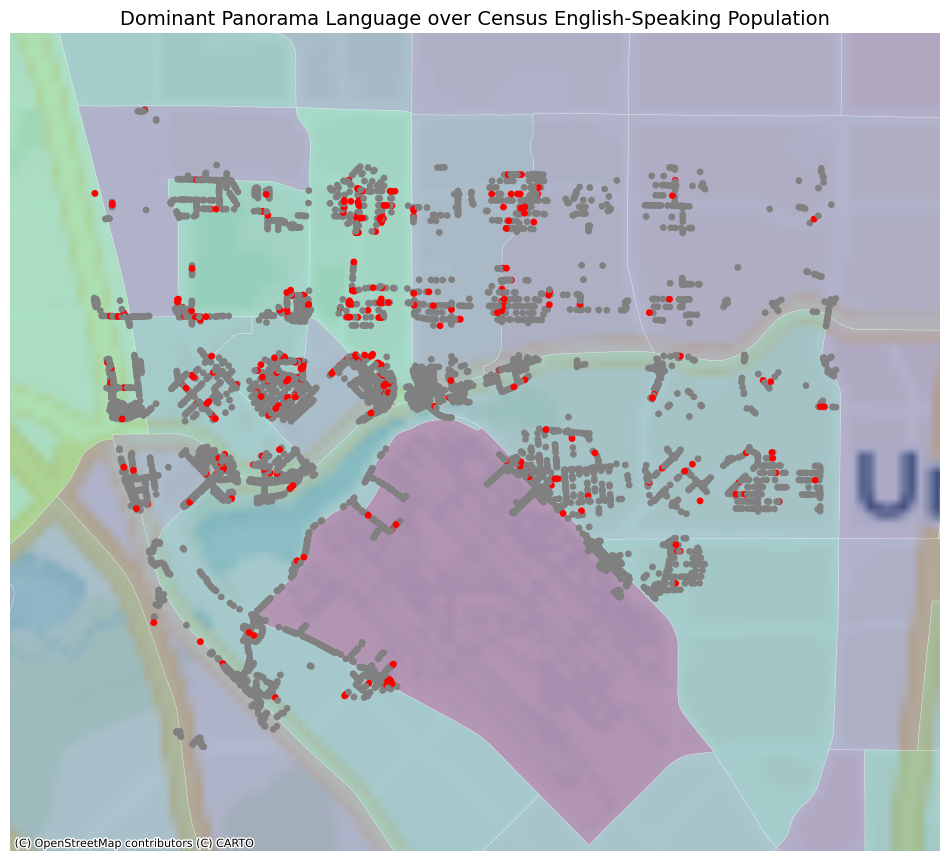

In [60]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx

# -----------------------------
# Convert both layers to Web Mercator
# -----------------------------
tracts = gdf[1:].to_crs(epsg=3857)
points = language_map.to_crs(epsg=3857)

# -----------------------------
# Find the census tracts to focus on
# -----------------------------
focus = tracts[
    tracts["name"].isin([
        "Census Tract 98.02, Dallas, TX",
        "Census Tract 94.01, Dallas, TX",
        "Census Tract 94.02, Dallas, TX"
    ])
]

# Get bounding box
xmin, ymin, xmax, ymax = focus.total_bounds

# Add padding
xpad = (xmax - xmin) * 1.0
ypad = (ymax - ymin) * 1.0

# -----------------------------
# Create figure
# -----------------------------
fig, ax = plt.subplots(figsize=(12, 12))

# Plot census tract choropleth
tracts.plot(
    ax=ax,
    column="C16001001",
    alpha=0.4,
    edgecolor="white",
    linewidth=0.4,
    legend=False,
    zorder=1
)

# Plot panorama language points
colors = {
    "english": "grey",
    "spanish": "red"
}

points.plot(
    ax=ax,
    color=points["language"].map(colors),
    markersize=15,
    zorder=3
)

# Add basemap underneath everything
ctx.add_basemap(
    ax,
    source=ctx.providers.CartoDB.Voyager
)

# Zoom to selected tracts
xpad = (xmax - xmin) * 0.8
ypad_top = (ymax - ymin) * 0.25
ypad_bottom = (ymax - ymin) * 1.5

ax.set_xlim(
    xmin - xpad,
    xmax + xpad
)

ax.set_ylim(
    ymin - ypad_bottom,
    ymax + ypad_top
)
# Clean up
ax.set_axis_off()
plt.title("Dominant Panorama Language over Census English-Speaking Population", fontsize=14)
plt.savefig(
    "language_map_with_dots.jpeg",
    dpi=300,
    bbox_inches="tight",
    format="jpeg"
)

plt.show()

In [61]:
print(gdf.crs)
print(language_map.crs)

print(gdf.total_bounds)
print(language_map.total_bounds)

EPSG:3857
EPSG:3857
[-10802297.00144887   3835093.14772877 -10744208.82136058
   3893935.69599493]
[-10784881.43558178   3873670.08685561 -10778124.17996417
   3879476.65508201]


In [62]:
import geopandas as gpd
import pandas as pd
from scipy.stats import pearsonr

# -------------------------------------------------
# 1. Calculate % English spoken at home (ACS C16001)
# -------------------------------------------------

# C16001001 = Total population 5 years and over
# C16001002 = Speak only English

tracts["pct_english"] = (
    tracts["C16001002"] /
    tracts["C16001001"]
) * 100


# -------------------------------------------------
# 2. Make sure both layers use the same CRS
# -------------------------------------------------

language_map = language_map.to_crs(tracts.crs)


# -------------------------------------------------
# 3. Spatial join: assign each panorama to a tract
# -------------------------------------------------

joined = gpd.sjoin(
    language_map,
    tracts[["geoid", "pct_english", "geometry"]],
    how="inner",
    predicate="within"
)


# -------------------------------------------------
# 4. Count English and Spanish panoramas by tract
# -------------------------------------------------

counts = (
    joined
    .groupby(["geoid", "language"])
    .size()
    .unstack(fill_value=0)
)


# Make sure both language columns exist
for col in ["english", "spanish"]:
    if col not in counts.columns:
        counts[col] = 0


# -------------------------------------------------
# 5. Calculate % Spanish-majority panoramas
# -------------------------------------------------

counts["total_panoramas"] = (
    counts["english"] +
    counts["spanish"]
)

counts["pct_spanish_panoramas"] = (
    counts["spanish"] /
    counts["total_panoramas"]
) * 100


# -------------------------------------------------
# 6. Add ACS English percentage back in
# -------------------------------------------------

analysis = counts.merge(
    tracts[["geoid", "pct_english"]].drop_duplicates(),
    on="geoid",
    how="left"
)


# Remove tracts with no panorama observations
analysis = analysis.dropna(
    subset=[
        "pct_english",
        "pct_spanish_panoramas"
    ]
)


# -------------------------------------------------
# 7. Pearson correlation
# -------------------------------------------------

r, p = pearsonr(
    analysis["pct_english"],
    analysis["pct_spanish_panoramas"]
)

print(f"Pearson correlation: {r:.3f}")
print(f"P-value: {p:.5f}")


# -------------------------------------------------
# 8. View results
# -------------------------------------------------

analysis.head()

Pearson correlation: -0.569
P-value: 0.01702


,geoid,english,spanish,total_panoramas,pct_spanish_panoramas,pct_english
0,14000US48113000410,581,16,597,2.680067,27.985612
1,14000US48113007102,164,4,168,2.380952,75.734297
2,14000US48113007203,279,17,296,5.743243,20.362473
3,14000US48113007204,270,36,306,11.764706,16.200361
4,14000US48113007205,273,39,312,12.500000,6.773697


In [63]:
analysis[[
    "pct_english",
    "pct_spanish_panoramas",
    "total_panoramas"
]].describe()

,pct_english,pct_spanish_panoramas,total_panoramas
count,17.000000,17.000000,17.000000
mean,47.455485,6.559666,290.882353
std,32.135727,5.566614,211.628768
min,6.773697,0.000000,2.000000
25%,16.200361,2.680067,168.000000
50%,45.511182,4.979253,296.000000
75%,76.987699,8.791209,343.000000
max,93.648586,22.384428,885.000000


In [64]:
'''
A Pearson correlation analysis was conducted to compare census-reported English 
language usage with observed Spanish-dominant panoramas from OCR analysis. 
The analysis revealed a moderate negative correlation between the percentage 
of residents speaking only English at home and the percentage of Spanish-dominant panoramas 
(r = -0.605, p = 0.010). This indicates that census tracts with lower English-only 
language prevalence tended to contain a greater proportion of panoramas dominated by Spanish text.
'''

'\nA Pearson correlation analysis was conducted to compare census-reported English \nlanguage usage with observed Spanish-dominant panoramas from OCR analysis. \nThe analysis revealed a moderate negative correlation between the percentage \nof residents speaking only English at home and the percentage of Spanish-dominant panoramas \n(r = -0.605, p = 0.010). This indicates that census tracts with lower English-only \nlanguage prevalence tended to contain a greater proportion of panoramas dominated by Spanish text.\n'